In [41]:
import pandas as pd
import numpy as np

### Goal: 
The stakeholder wanted to identify users that have submitted reviews that other users found very helpful
### Purpose: 
The stakeholder would like to offer an incentive program to reviews that consistently post reviews that are helpful so they can proivide early acess to those individuals so they can begint to review the game upon release to inform consumers.

## Import data

In [42]:
'''
This for loop was utilized to parse down the large .csv file into subfiles to upload project to github
'''

#review = pd.read_csv('data/review_info.csv')
#author = pd.read_csv('data/author_info.csv')
#game = pd.read_csv('data/game_info.csv')

#for i in range(1, 26):

 #   cut = review[(i-1) * int(1000000/25) : i * int(1000000/25)]
 #   cut.to_csv('data/review_info' + str(i) + '.csv')

#for i in range(1, 4):

  #  cut = author[(i-1) * int(len(author)/3) : i * int(len(author)/3)]
  #  cut.to_csv('data/author_info' + str(i) + '.csv')

#for i in range(1, 4):

  #  cut = game[(i-1) * int(len(game)/3) : i * int(len(game)/3)]
  #  cut.to_csv('data/game_info' + str(i) + '.csv')

'\nThis for loop was utilized to parse down the large .csv file into subfiles to upload project to github\n'

In [43]:
purchase_import = pd.read_csv("data/purchase_info.csv")

# iterating through review_info and concating the data together
for i in range(1, 25):
    frame = pd.read_csv("data/review_info" + str(i) + ".csv")
    if i == 1:
        review_import = frame
    else:
        review_import = pd.concat([review_import, frame])

for i in range(1, 4):
    frame = pd.read_csv("data/author_info" + str(i) + ".csv")
    if i == 1:
        author_import = frame
    else:
        author_import = pd.concat([author_import, frame])

for i in range(1, 4):
    frame = pd.read_csv("data/game_info" + str(i) + ".csv")
    if i == 1:
        game_import = frame
    else:
        game_import = pd.concat([game_import, frame])

In [44]:
df_1 = review_import.merge(purchase_import, on = 'review_id', how = 'left').merge(game_import, on = 'review_id', how = 'left').merge(author_import, on = 'review_id', how = 'left')
df_1.drop(columns = ['Unnamed: 0_x', 'Unnamed: 0_y', 'Unnamed: 0'], inplace = True)

In [45]:
column_mapping = { 'author.steamid' : 'steamid',
        'author.num_games_owned' : 'num_games_owned',
        'author.num_reviews' : 'num_reviews',
       'author.playtime_forever' : 'playtime_forever',
        'author.playtime_last_two_weeks' : 'playtime_last_two_weeks',
       'author.playtime_at_review': 'playtime_at_review', 
       'author.last_played' : 'last_played' 
       }

In [46]:
df_1.rename(columns = column_mapping, inplace = True)

In [47]:
df_1['steamid'] = df_1['steamid'].astype(object)

In [48]:
df_1.dtypes

review_id                        int64
language                        object
review                          object
timestamp_created                int64
timestamp_updated                int64
recommended                       bool
votes_helpful                    int64
votes_funny                      int64
weighted_vote_score            float64
comment_count                    int64
steam_purchase                    bool
received_for_free                 bool
written_during_early_access       bool
app_id                           int64
app_name                        object
steamid                         object
num_games_owned                  int64
num_reviews                      int64
playtime_forever               float64
playtime_last_two_weeks        float64
playtime_at_review             float64
last_played                    float64
dtype: object

In [49]:
df_1['review_len'] = df_1['review'].str.len() # using this later in review lenght analysis

In [50]:
top_voted_reviews = df_1.groupby('steamid')['votes_helpful'].sum().reset_index().sort_values('votes_helpful', ascending=False)
top_voted_reviews

,steamid,votes_helpful
651445,76561198301678331,26149
267144,76561198068792591,15526
380412,76561198107977827,14349
240265,76561198060932732,10610
543248,76561198193312194,10495
...,...,...
381123,76561198108298738,0
381126,76561198108299525,0
381127,76561198108299718,0
381129,76561198108300455,0


In [51]:
most_reviews = df_1.groupby('steamid')['review_id'].count().reset_index().sort_values('review_id', ascending=False)
most_reviews

,steamid,review_id
667373,76561198315585536,20
583806,76561198239163744,19
246189,76561198062813911,17
264717,76561198068116100,15
190089,76561198045381877,15
...,...,...
307584,76561198081016478,1
307585,76561198081016768,1
307586,76561198081017539,1
307587,76561198081018260,1


In [52]:
ohw = pd.merge(top_voted_reviews, most_reviews, on = 'steamid', how = 'left')
ohw

,steamid,votes_helpful,review_id
0,76561198301678331,26149,1
1,76561198068792591,15526,1
2,76561198107977827,14349,1
3,76561198060932732,10610,2
4,76561198193312194,10495,1
...,...,...,...
879270,76561198108298738,0,1
879271,76561198108299525,0,1
879272,76561198108299718,0,2
879273,76561198108300455,0,1


In [53]:
import plotly.express as px

px.histogram(ohw, x = 'review_id', template= 'simple_white', title = 'Histogram, Reviews per Reviewer')

In [54]:
review_count = ohw.groupby('review_id')['steamid'].count().reset_index()
review_count['cumperc'] = review_count['steamid'].cumsum()/review_count['steamid'].sum()*100
review_count

,review_id,steamid,cumperc
0,1,815199,92.712633
1,2,52594,98.694151
2,3,8309,99.639135
3,4,2071,99.874669
4,5,671,99.950982
5,6,225,99.976572
6,7,88,99.986580
7,8,52,99.992494
8,9,38,99.996816
9,10,18,99.998863


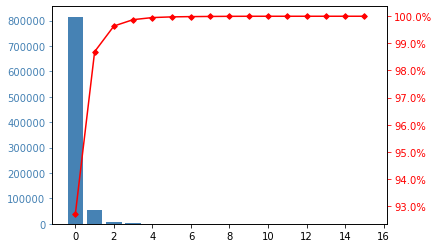

In [55]:
# https://www.statology.org/pareto-chart-python/

import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

#define aesthetics for plot
color1 = 'steelblue'
color2 = 'red'
line_size = 4

#create basic bar plot
fig, ax = plt.subplots()
ax.bar(review_count.index, review_count['steamid'], color=color1)

#add cumulative percentage line to plot
ax2 = ax.twinx()
ax2.plot(review_count.index, review_count['cumperc'], color=color2, marker="D", ms=line_size)
ax2.yaxis.set_major_formatter(PercentFormatter())

#specify axis colors
ax.tick_params(axis='y', colors=color1)
ax2.tick_params(axis='y', colors=color2)

#display Pareto chart
plt.show()

Over 92% of reviewers have only reviewed a single game, we probably won't be giving gift cards to people who have only written one review even if it was a stellar one, let's limit data to people who have written more than reviews. 

In [56]:
# the below variables can be adjusted to view different cohorts 

num_of_votes_helpful = 400
num_of_reviews = 3

top_reviewers = ohw[(ohw['votes_helpful'] >= num_of_votes_helpful) & 
                    (ohw['review_id'] >= num_of_reviews)]['steamid'] \
                    .values


top_reviewers_dataframe = df_1[df_1['steamid'].isin(top_reviewers)]



print("Cohort size:" , len(top_reviewers))

Cohort size: 85


In [57]:
# Reviewer Analysis
    # Number of games
    # Playtime per game Reviewed


# Review Analysis 
    #Character length of average review
    # Average comments

In [58]:
num_games_owned = top_reviewers_dataframe.groupby('steamid')['num_games_owned'].max().reset_index()
px.histogram(num_games_owned, 'num_games_owned', nbins = 50, template = 'simple_white', title = 'Number of Games Owned by Top Reviewers')

In [59]:
playtime_per_game = top_reviewers_dataframe.groupby('steamid')[['num_games_owned', 'playtime_forever']].max().reset_index()
playtime_per_game['playtime_per_game'] = playtime_per_game['playtime_forever'] / playtime_per_game['num_games_owned']
px.histogram(playtime_per_game, x = 'playtime_forever', template='simple_white', title = 'Playtime per Game Top Reviewers')

In [60]:

px.histogram(top_reviewers_dataframe, x = 'review_len', template = 'simple_white', title = 'Length of Review, Top Reviewers')

In [61]:
px.histogram(top_reviewers_dataframe, x = 'comment_count', template = 'simple_white', title = 'Number of Comments, Top Reviewers')